# IMA 208 TP5: homography estimation

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from numpy import linalg as LA

In this practical work, we will study how to estimate an homography between two given images. We will consider both the simple DLT algorithm (part I) and the RANSAC algorithm (part II).

To reduce the time you need for this practical work, we will use a few pre-implemented functions of openCV. Make sure that your library installation is correct before starting to work.

# Part 1: homography estimation from hand-selected keypoints: DLT algorithm

We assume that we have an image of a documents suffering from severe perspective distortion. The objective of this part is to warp this image (denoted in the following as img2) to remove the distortion using a reference image beeing in the desired pose (denoted as img1).

The following cell enables to vizualize the images using openCV.

(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x212bda8fb90>)

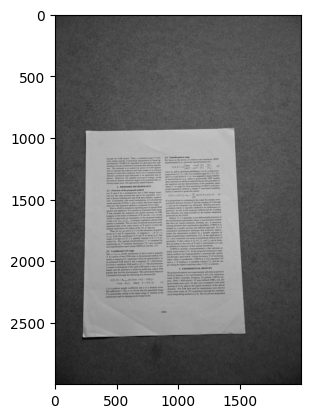

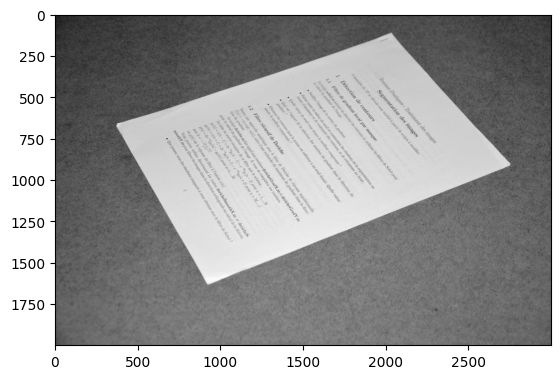

In [16]:
img1 = cv2.cvtColor(cv2.imread('Feuille_redressee.jpg'),cv2.COLOR_BGR2GRAY) # Reference image
img2 = cv2.cvtColor(cv2.imread('Feuille.jpg'),cv2.COLOR_BGR2GRAY) # Image to be processed

plt.figure(),plt.imshow(img1,cmap='gray')
plt.figure(),plt.imshow(img2,cmap='gray')

To correct the homography beetween the to images, we will need some points to match between the two images.

**Question:** how many points do you at least need to estimate the homography? Why?

**Answer:** As mentioned in the lecture, there is 8 degrees of freedom which mean we need at least 4 points supposing none of them is colinear with another one.

**Implementation:** to estimate the homography, some matching keypoints between the reference image and the to-be-porcessed one are given below. They here correspond to the corners of the two documents.

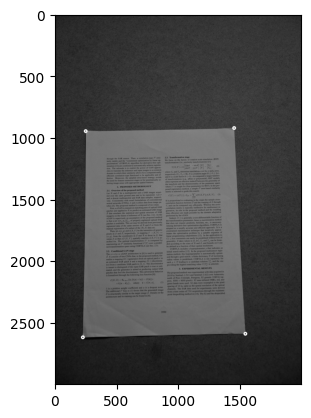

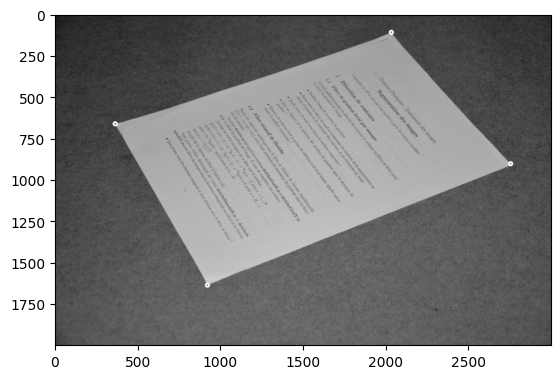

In [17]:
pts1 = [[248,949],[1450,924],[1541,2592],[225,2621]] # Keypoints for img1. Should be a list in format [[first_point_row,first_point_column],[second_point_row,second_point_column],...]
pts2 = [[2030,110],[2750,904],[920,1638],[363,663]] # Keypoints for img2,  keep the same order of the points as pts1.

# Below, we convert the points you found above into cv2 points object for vizualization (no need to change anything)
kp1 = [cv2.KeyPoint(pt[0], pt[1], 1) for pt in pts1]
kp2 = [cv2.KeyPoint(pt[0], pt[1], 1) for pt in pts2]

for i in range(len(pts1)):
    img1c=cv2.circle(img1,pts1[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img1c,cmap='gray')

for i in range(len(pts2)):
    img2c=cv2.circle(img2,pts2[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img2c,cmap='gray')

pts1 = np.array(pts1).T # In all the following, we will use the convention that np.shape(pts1) = [2,number_of_points]
pts2 = np.array(pts2).T # In all the following, we will use the convention that np.shape(pts1) = [2,number_of_points

**Visualize** the keypoints you found above to check that they are properly assigned.

Now, we will start implementing the DLT.

**Question:** recall what the DLT is. Give a pseudo code. What are its potential flaws and strengths?

**Answer:** DLT stands for direct linear transform. It is used to estimate the homogeneous matrix H given a set of 2d points.

Pseudo code:

1. **Normalize the points**  
   Normalize the set of points x and x' for better conditioning.

2. **Compute matrix ${A}$ for each correspondence**  
   For each correspondence ${x_i \leftrightarrow x_i'}$, compute the matrix ${A}$ given by equation (4.1) in the course.

3. **Assemble the composite matrix**  
   Combine the ${n \times{2} \times{9}}$ matrices ${A_i}$ into a single ${2n \times{9}}$ matrix ${A}$.

4. **Compute the SVD of *{A}***  
   - Obtain the Singular Value Decomposition (SVD) of ${A}$:  
     
     ${A = UDV^T}$
       
   - D is a diagonal matrix with positive entries in descending order.  
   - The unit singular vector corresponding to the smallest singular value is the solution h (last column of V ).

5. **Extract the homography matrix**  
   The matrix H is obtained by reshaping h.


The strengths of the DLT algorithm are its simplicity and its exactness. Given perfect correspondences, DLT provides the exact solution. Moreover it is flexible since it can handle rotations scaling, translations etc...

The flaws of this algorithm are mainly its numerical instability (requires normalization) and its sensitivity to outliers.

The first step of the DLT algorithm is to normalize the image point.

**Question:** Recall why the normalization is important. Recall how to do it.

**Answer:** Considering a point ${(x,y,w)^T=(100,100,1)^T} which corresponds to the typical orders of magnitude, we have a matrix A that is very ill-conditioned and therefor the system behavior is not consistent (computing SVD could lead to problems).

Steps:

1. **Normalization of ${x}$**
    Compute a similarity transformation T, consisting of a translation and scaling, that takes points ${x_{i}}$ to a new set of points ${\tilde{x_{i}}}$ such that the centrois of the points is the coordinate origin and their average distance from the origin is $\sqrt{2}$.

2. **Normalization of ${x'}$**
    Computea similar transformation ${T'}$ for the points in the second image, transforming points ${x_{i}'}$ to ${\tilde{x_{i}}'}$.



In the following, we will perform the normalization using the so called *homogeneous* coordinates of the keypoints. The main idea is to add a last coordinate equal to one for each point. The point (x,y) thus becomes (x,y,1) in homogeneous coordinate.

The advantage is that we will be able to do the normalization using a simple matrix product : X_norm = T@X.

**Fill** the blanks in the below implementation.

In [18]:
def normalize_image_points(imageEucl):
    """
    Input: 2D list with x,y image points
    Output: normalized data points
    """

    print("Normalizing data using similarity matrix...")

    mean, std = np.mean(imageEucl,axis=1),np.std(imageEucl,axis=1) # To be filled, (elementwise) mean and std of the data points

    N,M = np.shape(imageEucl)
    
    image = np.ones((N+1,M)) # Image in homogeneous coordinate
    image[:N,:] = imageEucl
    
    # Define a similarity matrix enabling to normalize the data. Write the cooefficients in Tranformation such that image_norm = image@Transformation
    Transformation = np.array([[std[0], 0, mean[0]],
                               [0, std[1], mean[1]],
                               [0, 0, 1]])
    try:
        Transformation = np.linalg.inv(Transformation)
    except:
        print('Singular matrix met, used pseudo inverse...')
        Transformation = LA.pinv(Transformation)

    # Apply transformation on data points
    image_norm = Transformation@image
    
    # Retrieve normalized image in the original input shape (25, 2)
    image_norm = image_norm[0:2,:]

    return image_norm, Transformation




**Question:** Verify that your data looks properly normalized.

**Answer**: Data looks normalized since we have the same order of magnitudes everywhere.

In [19]:
normalize_image_points(np.array(pts1))

Normalizing data using similarity matrix...


(array([[-0.98037024,  0.92643401,  1.07079273, -1.01685651],
        [-0.98490052, -1.01483671,  0.98250562,  1.0172316 ]]),
 array([[ 1.58635960e-03,  0.00000000e+00, -1.37378742e+00],
        [ 0.00000000e+00,  1.19744744e-03, -2.12127814e+00],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]))

The second step is to compute the A matrix from the normalized data points.

**Fill** the blanks in the function below.

**Question:** justify the shape of the A matrix.

**Answer:** ${A}$ is a matrix obtained by concatenating ${A_{i}}$ matrices. These one are obtained using the matchings ${x_i \leftrightarrow x_i'}$. They all satisfy the equation ${A_i \times{h} = 0 }$

The shape of ${A}$ is ${(2 \times{n_{matches}},9)}$. Each matrix ${A_i}$ is of size ${(2 \times 9)}$. Therefor with ${n_{matches}}$ points we obtain this shape by concatenating all the ${A_i}$.

In [20]:
def compute_matrix_A(points1, points2, no_points):
    """
    Input: Already normalized correspondences for image1 and image2
    Output: Matrix A as defined in Zisserman p. 91
    """

    A = []

    for i in range(0, no_points):
        x, y = points1[0, i], points1[1, i] # Denote the coordinate in image 1 x and y for shortcut
        x_prime, y_prime = points2[0, i], points2[1, i] # Denote the coordinate in image 2 x_prime and y_prime for shortcut

        # Create A_i according to the fomula given in class
        # here we are assuming w_i and w_i_prime are one
        A.append([0,0,0,-x,-y,-1,y_prime*x,y_prime*y,y_prime])
        A.append([x,y,1,0,0,0,-x_prime*x,-x_prime*y,-x_prime])
    print()
    print("Stacked matrix A shape:", np.shape(A))

    return np.asarray(A)



We are now ready to code the whole homography computation function. 

**Fill** the gaps below.

In [21]:
def compute_homography(pts1,pts2):

    # Set data points to numpy arrays
    no_points = pts1.shape[1] # Number of points

    # Normalize the data
    image1_normalized, T = normalize_image_points(pts1)
    image2_normalized, T_prime = normalize_image_points(pts2)
    
    # Get matrix A
    # A = ...
    A = compute_matrix_A(image1_normalized, image2_normalized, no_points)

    # Compute SVD of A
    U, S, V = LA.svd(A)
    V = V.T # So that A = USV.T
    
    # Get last column of V (this is the vector h)
    h = V[:,-1]
    
    # Obtain homography by reshaping h (H tilde)
    print()
    print("Reshaping to get homography H_tilde...")
    H_tilde = h.reshape((3,3))

    # Denormalize to obtain homography (H) using the transformations and generalized pseudo-inverse
    try:
        H = LA.inv(T_prime) @ H_tilde @ T
    except:
        H = LA.pinv(T_prime) @ H_tilde @ T
        print('Singular matrix met, used pseudo inverse...')

    print()
    print("Denormalized to obtain homography H for 2D data points...")
    print("Matrix H:")
    print(H)
    
    return H

**Question:** Apply the compute_homography function to warp the document image 2 into the perspective of document 1. Any comment ?

**Answer:** We obtained a convincing result which mean our algorithm works fine. 

We can notice that in our matrix ${H}$, the coefficients ${H_{31}}$ and ${H{32}}$ are really small compared to all the other one. We could therefor try to set them to 0 and work with a 6 dof matrix requiring only 3 points. 

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 1.89756456e-01 -6.18024327e-01  1.80016938e+03]
 [ 3.58876320e-01  2.07702314e-01 -2.17795736e+02]
 [-6.16994599e-05 -4.83098365e-06  6.40932323e-01]]


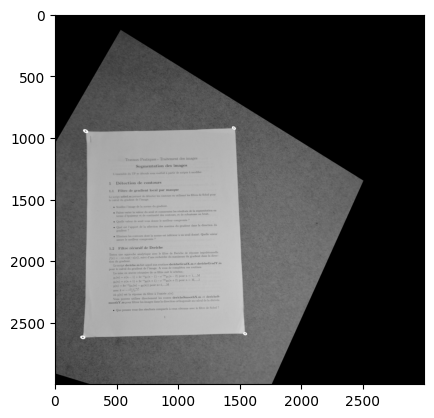

In [22]:
H = compute_homography(pts1,pts2)
homography_matrix_normalized = H / H[2,2]
result = cv2.warpPerspective(img2, np.linalg.inv(homography_matrix_normalized),(3000,3000))
plt.imshow(result,cmap='gray')

In [23]:
print(homography_matrix_normalized)

[[ 2.96063170e-01 -9.64258323e-01  2.80867311e+03]
 [ 5.59928571e-01  3.24062786e-01 -3.39810816e+02]
 [-9.62651714e-05 -7.53743176e-06  1.00000000e+00]]


**Question:** test the sensitivity of the above algorithm to errors in the matching keypoints. Are you able to obtain good results if you have a false match?

Answer to the same question is you have more matching points than the corners.

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (10, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 5.77385994e-01 -1.63481670e-01  3.78987037e+02]
 [ 3.70934098e-01  3.20122538e-01 -2.61041344e+02]
 [-2.68953332e-05  2.54653935e-04  1.56938881e-01]]


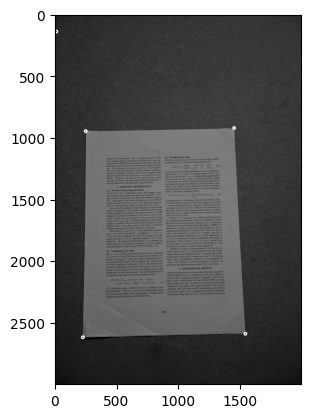

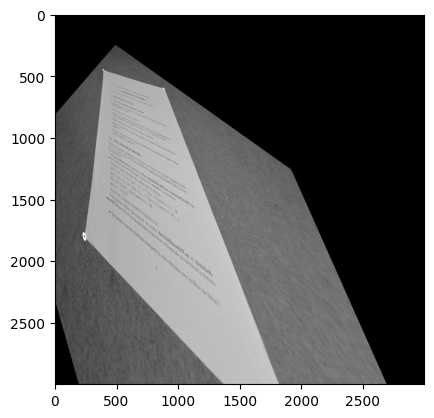

In [24]:
pts1 = [[248,949],[1450,924],[1541,2592],[225,2621]] # Keypoints for img1. Should be a list in format [[first_point_row,first_point_column],[second_point_row,second_point_column],...]
pts2 = [[2030,110],[2750,904],[920,1638],[363,663]] # Keypoints for img2,  keep the same order of the points as pts1.

pts1 += [[10,142]]
pts2 += [[25,136]]

for i in range(len(pts1)):
    img1c_dec=cv2.circle(img1,pts1[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img1c_dec,cmap='gray')

for i in range(len(pts2)):
    img2c_dec=cv2.circle(img2,pts2[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img2c_dec,cmap='gray')

pts1 = np.array(pts1).T # In all the following, we will use the convention that np.shape(pts1) = [2xnumber_of_points]
pts2 = np.array(pts2).T # In all the following, we will use the convention that np.shape(pts1) = [2xnumber_of_points]

H = compute_homography(pts1,pts2)
homography_matrix_normalized = H / H[2, 2]
result = cv2.warpPerspective(img2, np.linalg.inv(homography_matrix_normalized),(3000,3000))
plt.imshow(result,cmap='gray')

**Answer**: Having mismatches gives really bad results since we need 4 good matches in order to make our algorithm work. If we have a higher number of points, having some errors should not affect the result.

The difficulty is too find a high number of matches. Here we are going to cheat a little bit by using the previous homography matrix to compute some good matches point. Then we will try to add some erronous points to see how it disturbs the algorithm.

In [25]:
pts1 = [[248,949],[1450,924],[1541,2592],[225,2621]] # Keypoints for img1. Should be a list in format [[first_point_row,first_point_column],[second_point_row,second_point_column],...]
pts2 = [[2030,110],[2750,904],[920,1638],[363,663]] # Keypoints for img2,  keep the same order of the points as pts1.


for i in range(len(pts1)):
    img1c_dec=cv2.circle(img1,pts1[i],radius=10,color=(255,0,0),thickness=10)

for i in range(len(pts2)):
    img2c_dec=cv2.circle(img2,pts2[i],radius=10,color=(255,0,0),thickness=10)

pts1 = np.array(pts1).T # In all the following, we will use the convention that np.shape(pts1) = [2xnumber_of_points]
pts2 = np.array(pts2).T # In all the following, we will use the convention that np.shape(pts1) = [2xnumber_of_points]

H = compute_homography(pts1,pts2)
homography_matrix_normalized = H / H[2, 2]

best_H = homography_matrix_normalized

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 1.89756456e-01 -6.18024327e-01  1.80016938e+03]
 [ 3.58876320e-01  2.07702314e-01 -2.17795736e+02]
 [-6.16994599e-05 -4.83098365e-06  6.40932323e-01]]


In [26]:
def compute_matches(H,points):
    pts = []
    for point in points:
        tmp = np.array([point[0],point[1],1])
        transformation = H @ tmp
        transformation = transformation/transformation[2]
        pts.append(transformation[:2].astype(int))
    return np.array(pts)

(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x212bde1fad0>)

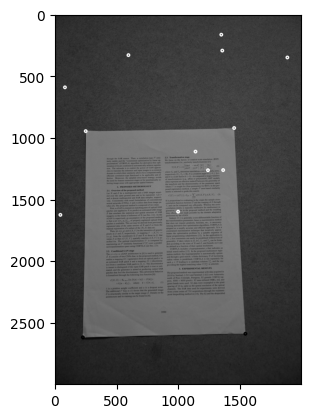

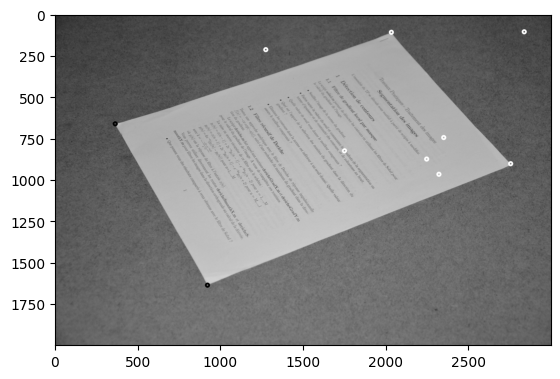

In [27]:
nb_pts = 10

img1 = cv2.cvtColor(cv2.imread('Feuille_redressee.jpg'),cv2.COLOR_BGR2GRAY) # Reference image
img2 = cv2.cvtColor(cv2.imread('Feuille.jpg'),cv2.COLOR_BGR2GRAY) # Image to be processed

random_points = np.random.randint(0,min(*img1.shape),size=(nb_pts,2))
matches = compute_matches(best_H,random_points)

new_pts1 = np.concatenate([pts1,random_points.T],axis=1)
new_pts2 = np.concatenate([pts2,matches.T],axis=1)

for i in range(len(new_pts1[1])):
    if (i==2 or i==3) :
      img10c_dec=cv2.circle(img1,new_pts1.T[i],radius=10,color=(0,0,0),thickness=10)
    else :
      img10c_dec=cv2.circle(img1,new_pts1.T[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img10c_dec,cmap='gray')

for i in range(len(new_pts2[1])):
    if (i==2 or i==3) :
      img10c_dec=cv2.circle(img2,new_pts2.T[i],radius=10,color=(0,0,0),thickness=10)
    else :
      img20c_dec=cv2.circle(img2,new_pts2.T[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img20c_dec,cmap='gray')

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (28, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 1.86207803e-01 -6.07632551e-01  1.76984952e+03]
 [ 3.52467727e-01  2.04088924e-01 -2.13865438e+02]
 [-6.08354034e-05 -4.86858045e-06  6.30345710e-01]]


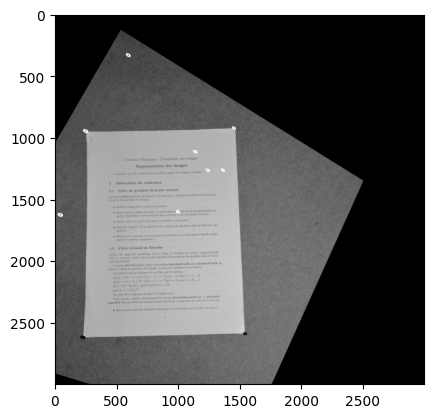

In [28]:
H = compute_homography(new_pts1,new_pts2)
homography_matrix_normalized = H / H[2, 2]
result = cv2.warpPerspective(img2, np.linalg.inv(homography_matrix_normalized),(3000,3000))
plt.imshow(result,cmap='gray')

**Answer:** We still have good results as expected. Now let's try to add some mismatches.

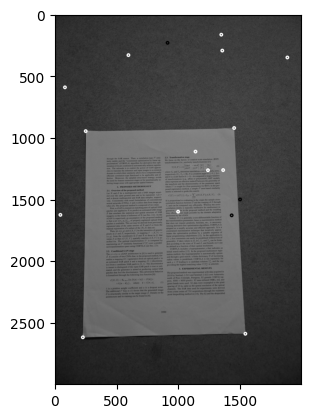

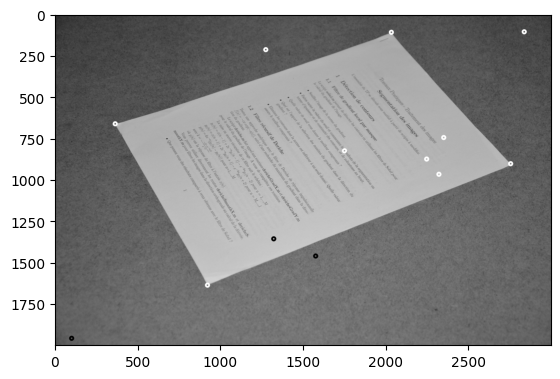

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (28, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 1.86207803e-01 -6.07632551e-01  1.76984952e+03]
 [ 3.52467727e-01  2.04088924e-01 -2.13865438e+02]
 [-6.08354034e-05 -4.86858045e-06  6.30345710e-01]]


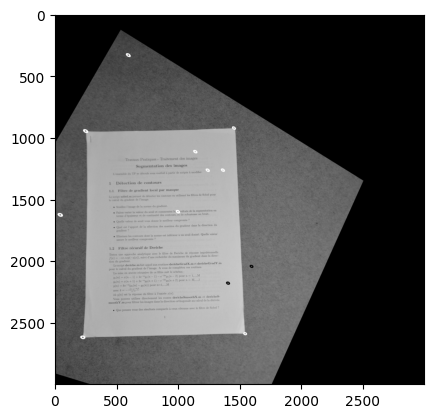

(<matplotlib.image.AxesImage at 0x212aafc7950>, None)

In [29]:
mismatches1 = np.random.randint(0,min(*img1.shape),size=(3,2))
mismatches2 = np.random.randint(0,min(*img2.shape),size=(3,2))

mm_pts1 = np.concatenate([new_pts1,mismatches1.T],axis=1)
mm_pts2 = np.concatenate([new_pts2,mismatches2.T],axis=1)

for i in range(len(mm_pts1[1])):
  if i >= len(new_pts1[1]):  # Points from mismatches
    img10c_dec = cv2.circle(img1, mm_pts1.T[i], radius=10, color=(0, 0, 255), thickness=10)
  else:
    img10c_dec = cv2.circle(img1, mm_pts1.T[i], radius=10, color=(255, 0, 0), thickness=10)
plt.figure(), plt.imshow(img10c_dec, cmap='gray'),plt.show()

for i in range(len(mm_pts2[1])):
  if i >= len(new_pts2[1]):  # Points from mismatches
    img20c_dec = cv2.circle(img2, mm_pts2.T[i], radius=10, color=(0, 0, 255), thickness=10)
  else:
    img20c_dec = cv2.circle(img2, mm_pts2.T[i], radius=10, color=(255, 0, 0), thickness=10)
plt.figure(), plt.imshow(img20c_dec, cmap='gray'),plt.show()

H = compute_homography(new_pts1,new_pts2)
homography_matrix_normalized = H / H[2, 2]
result = cv2.warpPerspective(img2, np.linalg.inv(homography_matrix_normalized),(3000,3000))
plt.imshow(result,cmap='gray'),plt.show()

**Answer:** As we can see above, if the mismatches points (black ones) are not too many compared to the true matches (white ones), it will not affect the algorithm.

# Part 2: automatic homography estimation and panorama stitching

To bypass the flaws that we observed with the previous method, we now propose to use a robust homography estimation method, the RANSAC algorithm. As an application, we will consider panorama stitching: from two given overlapping images, create a single one which is a panorama. To do that, we will need to estimate the best homography to warp an image into the perspective of the other. In addition, to avoid the cumbersome choice of the matching points between the two images, we will do an automatic keypoint identification by using the SIFT features.

Let us first load the two considered images.

(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x212aac68410>)

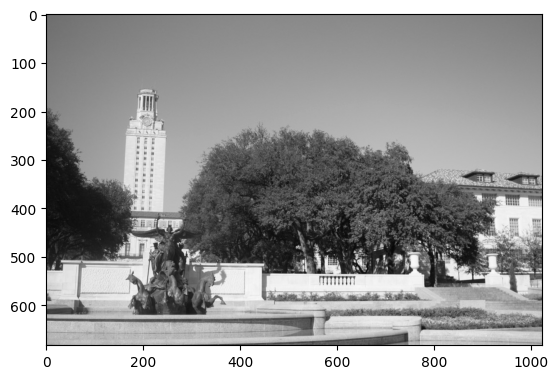

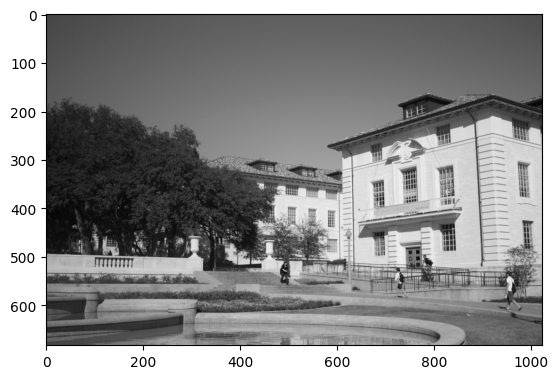

In [30]:
img1c = cv2.cvtColor(cv2.imread('uttower_left.jpg'),cv2.COLOR_BGR2GRAY)
img2c = cv2.cvtColor(cv2.imread('uttower_right.jpg'),cv2.COLOR_BGR2GRAY)

img1 = img1c
img2 = img2c

plt.figure(),plt.imshow(img1,cmap='gray')
plt.figure(),plt.imshow(img2,cmap='gray')

To stitch the two images, we need to have access to pair of corresponding points between image 1 and image 2. To do that, we first need to extract some keypoints in both images (that will be matched later on). We will use here the SIFT descriptors.

**Implement** the SIFT descriptors for both image 1 and image 2. You might be willing to use the cv2.SIFT_create and sift.detectAndCompute.

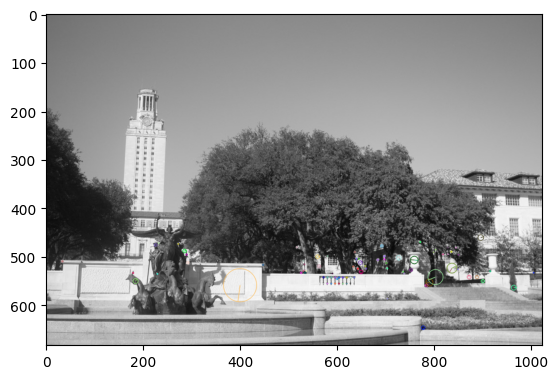

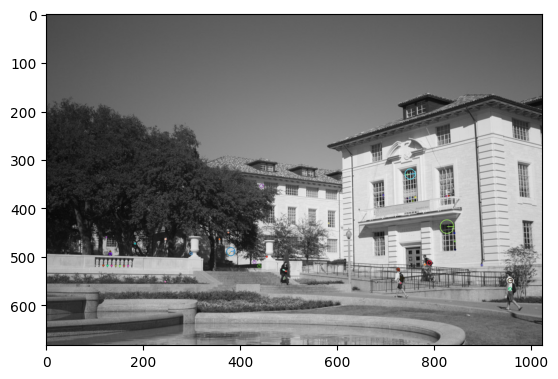

In [31]:
sift = cv2.SIFT.create(nfeatures=0,contrastThreshold=0.2) # Creates an object of the SIFT class. The larger the threshold, the smaller the number of points
kp1,desc1 = sift.detectAndCompute(img1,None) #kp1 = location of the keypoints, desc1 = corresponding descriptors.

# For visualization
img1c=cv2.drawKeypoints(img1,kp1,img1c,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img1c)
plt.show()

kp2,desc2 = sift.detectAndCompute(img2, None) #kp2 = location of the keypoints, desc2 = corresponding descriptors.
img2c=cv2.drawKeypoints(img2,kp2,img2c,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img2c)

In [32]:
desc1.shape,desc2.shape

((123, 128), (68, 128))

In [33]:
len(kp1),len(kp2)

(123, 68)

**Question:** explain the shapes of desc1, kp1 and desc2, kp2 and their respective roles.

**Answer:** kp1 and kp2 stand for keypoints. They are tuples (1xN array like) containing the length of detected keypoints in images. Each of these keypoints have attributes as its coordinates, its size etc...
desc1 and desc2 are numpy arrays of size Nx128. The 128 dimensional feature discribes the keypoint's neighborhood. It is 128 because it looks to the 16x16 pixels around and computes its gradient magnitude and orientation. It is therefore divided into 1- smaller 4x4 sub-regions where each sub-region contributes to 8 orientation bins (covering 0 to 360 degrees). Then 8 dimensional histograms are created and all are concatenated wich results in 16x8=128 bins. 

The role of kp1-2 is to store the locations and properties of each distinctive point in the image while the role of desc1-2 is used to quantify the appearance of each point.

Now that we have obtained the SIFT descriptor, we have to match them.

**Complete** the following code.

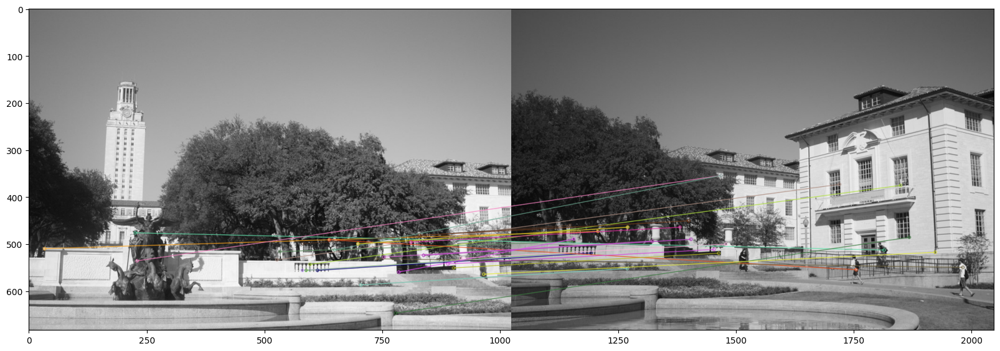

(<Figure size 2000x1200 with 1 Axes>,
 None)

In [34]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(desc1,desc2) 

# For visualizing the matches
img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches[:100], img2, flags=2)
plt.figure(figsize=(20,12)),plt.imshow(img3),plt.show()

In [35]:
print('Matches: ',len(matches))

Matches:  29


In [36]:
29/68

0.4264705882352941

**Question:** comment the match quality. Do you think that the previous matching would enable a decent homography computation using the DLT algorithm of the first part?

**Answer:** We have around 29 matches for respectively 123 and 68 descriptors for images 1 and 2. This means that we only have about 43% of matches. But even with this selectiveness, we see that the result is not good. We have a lot of mismatches. 

DLT would not give better results here since it works fine when majority of our points have good matches.

The following code enables to keep only the coordinates of the 100 best matches in the two images. We will use them as an input of a RANSAC, which will enable to do a robust homography estimation between the two images.

In [37]:
n = min(100,len(matches))

D1 = np.ones((2,n)) # Coordinates in image 1 of the first best matching points
D2 = np.ones((2,n)) # Coordinates in image 2 of the first best matching points
for ii in range(n):
    D1[:,ii] = kp1[matches[ii].queryIdx].pt
    D2[:,ii] = kp2[matches[ii].trainIdx].pt

D1 = D1.astype(int)
D2 = D2.astype(int)

Now, we are ready to code the RANSAC algorithm.

**Fill** the gaps in the code below.

In [38]:
def ransac(D1, D2, num, threshold, iterations):
    # D1, D2 : matched points between the two images
    # num : number of points to compute the homography
    # threshold : distance threshold for determining if a pair of point in an inlier or an outlier
    # iterations : number of iterations / number of sampling
    
    N,M = D1.shape

    D1h = np.ones((N+1,M)) #D1h correspond to D1 transformed into homogeneous coordinates
    D1h[0:2,:] = D1
    
    N,M = D2.shape
    D2h = np.ones((N+1,M)) #D2h correspond to D2 transformed into homogeneous coordinates
    D2h[0:2,:] = D2
        
    n = D1.shape[1] # Number of points in D1
    

    best_n_inlier = 0
    best_H = np.zeros((3,3)) # Best homography matrix. Fill the gap with a matrix of the right size full of 0.
    
    for i in range(iterations):
        s = np.random.choice(n,size=4) # Draw randomly 4 indices to extract 4 points among D1 and D2. You can use np.random.choice()
        
        pts1 =  D1[:, s] #pts1 is the chosen points among D1
        pts2 =  D2[:, s] #pts2 is the chosen points among D2
        
        H = compute_homography(pts1,pts2) # Compute the corresponding homography. You can reuse the function of part I.
        
        D2_new = np.dot(H, D1h) # Transform the points of D1h to be able to compare them to the ones of D2h
        
        # Normalize D2_new
        D2_new[0, :] = np.divide(D2_new[0, :],D2_new[2, :])
        D2_new[1, :] = np.divide(D2_new[1, :],D2_new[2, :])
        D2_new[2, :] = np.divide(D2_new[2, :],D2_new[2, :])
        
        
        tmp = (D2_new-D2h)**2
        SD = np.sqrt(np.sum(tmp, axis=0))# Compute the distance between D2_new and D2h
        
        inliers = SD<threshold # Compute the inliers
        num_inlier = np.sum(inliers)# Compute the number of inliers
        
        if num_inlier > best_n_inlier: # If you obtained the best result, store the corresponding homography
            best_H = H
            best_n_inlier = num_inlier
            point1 = D1[:2, inliers]
            point2 = D2[:2, inliers]
            in_res = SD[inliers]
    
    
    return best_H, best_n_inlier, point1, point2, in_res

Using the function you implemented above, **launch the RANSAC algorithm** to estimate the homography between the two images.

In [39]:
threshold = 1;
num = 4;
iterations = 1000;
[H, inliers, point1, point2, residue] = ransac(D1, D2, num,threshold, iterations)

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 1.15584809e+00 -1.64640059e+00  2.52774509e+02]
 [ 6.37454076e-01  9.03032136e-01 -7.48806326e+02]
 [ 1.69947049e-03 -5.09977243e-04 -4.82475175e-01]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[-6.24436230e-01 -1.41687053e+01  7.67793244e+03]
 [-1.10319782e+00 -1.64667180e+01  9.24884156e+03]
 [-2.42327985e-03 -3.73980629e-02  2.09169493e+01]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 3.

C:\Users\ayman\AppData\Local\Temp\ipykernel_30596\2704943055.py:33: RuntimeWarning: invalid value encountered in divide
  D2_new[0, :] = np.divide(D2_new[0, :],D2_new[2, :])
C:\Users\ayman\AppData\Local\Temp\ipykernel_30596\2704943055.py:34: RuntimeWarning: invalid value encountered in divide
  D2_new[1, :] = np.divide(D2_new[1, :],D2_new[2, :])
C:\Users\ayman\AppData\Local\Temp\ipykernel_30596\2704943055.py:35: RuntimeWarning: invalid value encountered in divide
  D2_new[2, :] = np.divide(D2_new[2, :],D2_new[2, :])



Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 8.87930023e-01  2.42865785e+00 -1.82231408e+03]
 [ 6.21683266e-01  3.56894635e+00 -2.14102911e+03]
 [ 1.27918535e-03  6.60532044e-03 -4.02244125e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[-4.74095362e-01  1.56083279e+00 -4.70176800e+02]
 [-1.70022816e+00 -6.27849918e-01  1.79739063e+03]
 [-3.23805092e-03 -1.04223139e-04  2.82864487e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 1.24701943e+00  1.54764419e+01 -8.61945992e+03]
 [ 1.33352070e+00  1.52036748e+01 -8.48239316e+03]
 [ 2.71005177e-03  2.92

C:\Users\ayman\AppData\Local\Temp\ipykernel_30596\2704943055.py:33: RuntimeWarning: divide by zero encountered in divide
  D2_new[0, :] = np.divide(D2_new[0, :],D2_new[2, :])
C:\Users\ayman\AppData\Local\Temp\ipykernel_30596\2704943055.py:34: RuntimeWarning: divide by zero encountered in divide
  D2_new[1, :] = np.divide(D2_new[1, :],D2_new[2, :])


Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 1.00059313e+00 -8.91016263e+00  4.03171417e+03]
 [ 9.55628648e-01 -5.25888088e+00  2.11026522e+03]
 [ 1.92410533e-03 -1.07819680e-02  4.34759378e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 1.48961365e-02 -1.77171887e+00  9.86442173e+02]
 [-3.58971100e-02 -3.28693816e+00  1.89426860e+03]
 [-2.35896525e-05 -7.77545676e-03  4.42367087e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[-8.

In [40]:
print(H)

[[-6.05981653e-01  7.25732801e-02  2.45651503e+02]
 [-6.97227265e-02 -5.29191314e-01  4.65749376e+01]
 [-1.12733447e-04  8.60419053e-05 -5.37863325e-01]]


Lastly, **fill the code** below to warp img2 into the same space as img1

In [41]:
result = cv2.warpPerspective(img2, np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]))
result[0:img1.shape[0], 0:img1.shape[1]] = img1

**Question:** Plot the panorama image. How good is it? Any comment?

**Answer**: The result is not bad but not convinving either. We see a difference of luminosity. Moreover the warping is not always awesome.
It depends on the descriptors used. Therefor the choice of the above parameter **contrastThreshold** in the function **cv2.SIFT.create** is really important. After changing it we found this result below. 

(<Figure size 4000x2000 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x212bdeadb90>)

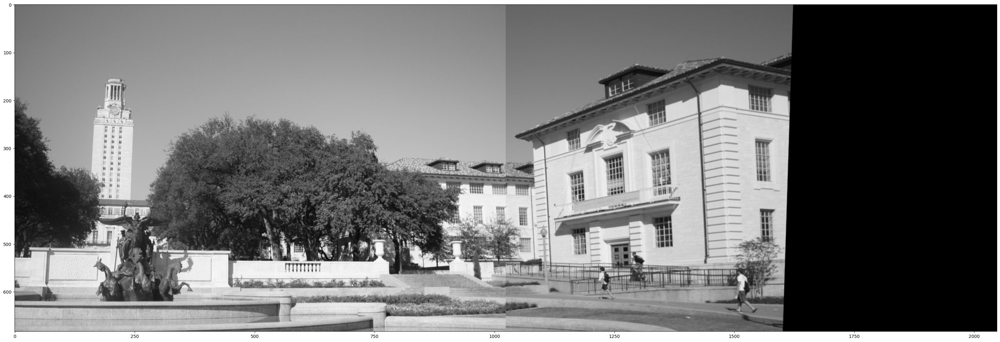

In [42]:
plt.figure(figsize=(40,20)),plt.imshow(result,cmap='gray')

**Bonus**: try other descriptors than the SIFT ones. Try to implement your own.

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 7.15848416e-01 -3.85807068e+00  1.17172066e+03]
 [ 5.65117122e-01 -3.43257970e+00  1.08041240e+03]
 [ 1.08827803e-03 -6.65427410e-03  2.11018328e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[-6.47489669e-01  1.93422773e+00 -4.31175026e+02]
 [-6.90804615e-01  3.11461335e+00 -9.70506254e+02]
 [-1.43608925e-03  5.71647148e-03 -1.65019374e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 8.

(<Figure size 4000x2000 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x212ce0aefd0>)

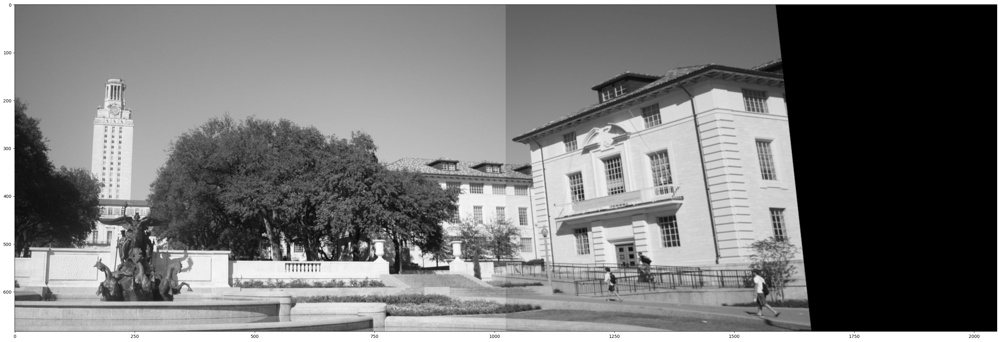

In [50]:
#Using AKAZE descriptors

akaze = cv2.AKAZE_create()
kp1, desc1 = akaze.detectAndCompute(img1, None)
kp2, desc2 = akaze.detectAndCompute(img2, None)

bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True) # Creates an object of the BFMatcher class. The larger the threshold, the smaller the number of points

matches = bf.match(desc1,desc2) 

n = min(100,len(matches))

D1 = np.ones((2,n)) # Coordinates in image 1 of the first best matching points
D2 = np.ones((2,n)) # Coordinates in image 2 of the first best matching points
for ii in range(n):
    D1[:,ii] = kp1[matches[ii].queryIdx].pt
    D2[:,ii] = kp2[matches[ii].trainIdx].pt

D1 = D1.astype(int)
D2 = D2.astype(int)


threshold = 1;
num = 4;
iterations = 1000;
[H, inliers, point1, point2, residue] = ransac(D1, D2, num,threshold, iterations)

result_akaze = cv2.warpPerspective(img2, np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]))
result_akaze[0:img1.shape[0], 0:img1.shape[1]] = img1

plt.figure(figsize=(40,20)),plt.imshow(result_akaze,cmap='gray')

AKAZE gives a slightly better result than SIFT

---

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[-6.39682101e-03 -7.47588466e-02  3.45572471e+01]
 [ 9.12728940e-01  2.18675913e+00 -1.74549079e+03]
 [ 1.82611621e-03  4.38127615e-03 -3.49517794e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 1.11016731e+00  1.81977702e+00 -1.63037580e+03]
 [ 1.26022444e+00  3.18652064e+00 -2.35717888e+03]
 [ 2.54127604e-03  5.85904574e-03 -4.45251823e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[-1.

(<Figure size 4000x2000 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x212aac6c190>)

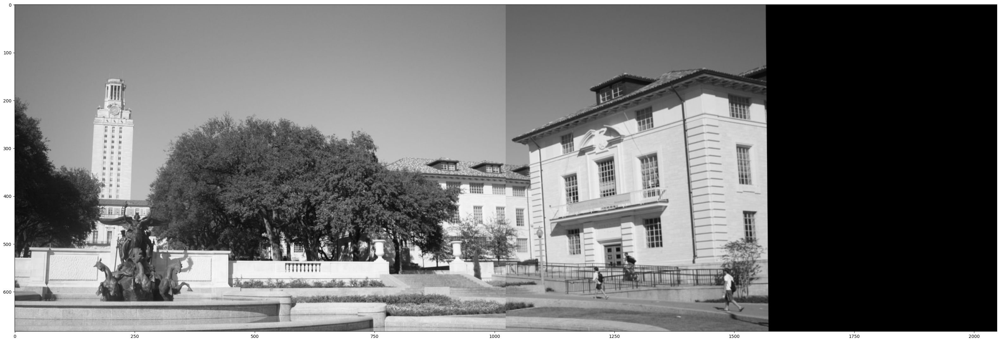

In [ ]:
#Using ORB descriptors

orb = cv2.ORB_create(nfeatures=1000)
kp1, desc1 = orb.detectAndCompute(img1, None)
kp2, desc2 = orb.detectAndCompute(img2, None)

matches = bf.match(desc1,desc2) 

n = min(100,len(matches))

D1 = np.ones((2,n)) # Coordinates in image 1 of the first best matching points
D2 = np.ones((2,n)) # Coordinates in image 2 of the first best matching points
for ii in range(n):
    D1[:,ii] = kp1[matches[ii].queryIdx].pt
    D2[:,ii] = kp2[matches[ii].trainIdx].pt

D1 = D1.astype(int)
D2 = D2.astype(int)


threshold = 1;
num = 4;
iterations = 1000;
[H, inliers, point1, point2, residue] = ransac(D1, D2, num,threshold, iterations)

result = cv2.warpPerspective(img2, np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]))
result[0:img1.shape[0], 0:img1.shape[1]] = img1

plt.figure(figsize=(40,20)),plt.imshow(result,cmap='gray')

The result obtained here is definitely not the best one.

---

**Bonus:** try to correct the change of luminosity between the two images so that the panorama look more realistic.

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 3.35196585e+00 -4.17157149e+00 -1.24448021e+03]
 [ 2.65280754e+00 -3.30995976e+00 -9.83984353e+02]
 [ 8.23611276e-03 -1.00978769e-02 -3.11848255e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[-1.17012151e+00  1.15741124e+00  2.84266380e+02]
 [-5.95650272e-01  6.48498154e-01  6.70536201e+01]
 [-1.79498745e-03  3.25199863e-03 -2.88154879e-01]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[-1.

(<Figure size 4000x2000 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x212ce0fa050>)

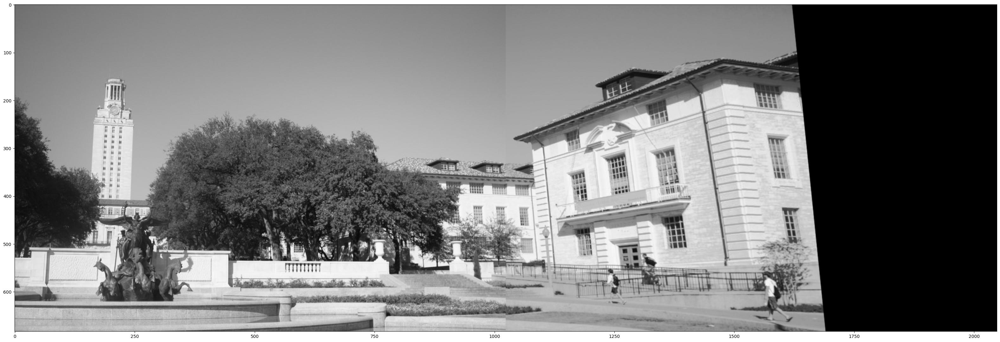

In [54]:
# Function to match histograms
def match_histogram(source, reference):
    source_hist, bins = np.histogram(source.flatten(), 256, [0, 256])
    reference_hist, _ = np.histogram(reference.flatten(), 256, [0, 256])

    cdf_source = np.cumsum(source_hist).astype(float)
    cdf_source /= cdf_source[-1]

    cdf_reference = np.cumsum(reference_hist).astype(float)
    cdf_reference /= cdf_reference[-1]

    lookup_table = np.interp(cdf_source, cdf_reference, np.arange(256))


    matched = cv2.LUT(source, lookup_table.astype(np.uint8))
    return matched


img2_matched = match_histogram(img2, img1)


akaze = cv2.AKAZE_create()
kp1, desc1 = akaze.detectAndCompute(img1, None)
kp2, desc2 = akaze.detectAndCompute(img2_matched, None)

bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True) # Creates an object of the BFMatcher class. The larger the threshold, the smaller the number of points

matches = bf.match(desc1,desc2) 

n = min(100,len(matches))

D1 = np.ones((2,n)) # Coordinates in image 1 of the first best matching points
D2 = np.ones((2,n)) # Coordinates in image 2 of the first best matching points
for ii in range(n):
    D1[:,ii] = kp1[matches[ii].queryIdx].pt
    D2[:,ii] = kp2[matches[ii].trainIdx].pt

D1 = D1.astype(int)
D2 = D2.astype(int)


threshold = 1;
num = 4;
iterations = 1000;
[H, inliers, point1, point2, residue] = ransac(D1, D2, num,threshold, iterations)

result_akaze = cv2.warpPerspective(img2_matched, np.linalg.inv(H),(img1.shape[1] + img2_matched.shape[1], img1.shape[0]))
result_akaze[0:img1.shape[0], 0:img1.shape[1]] = img1

plt.figure(figsize=(40,20)),plt.imshow(result_akaze,cmap='gray')
